In [21]:
import numpy as np
from scipy.stats import norm
import math
from scipy.optimize import minimize_scalar
from pathlib import Path
import cv2
import os
from PIL import Image
import matplotlib.pyplot as plt

%config InlineBackend.figure_formats = 'svg'

In [22]:
class JNDModel:
    
    def __init__(self, L_MIN = 0.1, L_MAX = 300, t = 1, phi_d = 1e-3, p = 0.75):
        self.L_MIN = L_MIN
        self.L_MAX = L_MAX
        self.t = t # время экспозиции (наблюдения) объекта в секундах
        self.phi_d = phi_d # угловой размер объекта (в радианах)
        self.p = p # требуемая вероятность обнаружения объекта
        self.L0 = 1e-6
    
    @classmethod
    def from_screen_params(cls, screen_diag_inch = 16, screen_width_px = 1920, screen_height_px = 1080, distance_m = 0.5,
                           l_gray = 60, **kwargs):
        '''
        Фабричный метод для инициализации JNDModel с рассчетом phi_d на основе параметров экрана
        '''
        diag_px = math.sqrt(screen_width_px ** 2 + screen_height_px ** 2)
        ppi = diag_px / screen_diag_inch
        
        pixel_size_m = 0.0254 / ppi # 1 дюйм = 0.0254 метра

        phi_d = pixel_size_m / distance_m

        instance = cls(phi_d=phi_d, **kwargs)

        instance.screen_width_px = screen_width_px
        instance.screen_height_px = screen_height_px
        instance.ppi = ppi
        instance.l_gray = l_gray

        return instance

    def _K(self, lambd, b1 = 0.98, b2 = 0.1, lambd1 = 2e-2):
        lambd = np.asarray(lambd, dtype = np.float64)
        return np.where(lambd <= 1, b1 * (1 + lambd1 / lambd), lambd ** b2)
    
    def _A(self, La, a1 = 4.8e6, a2 = 7.1e3, a3 = 4.5e-4): # единицы измерения параметров a1, a2, a3: м ** 2 / кд
        '''
        Функция, характеризующая ослабление сигнала в зрительной системе в результате процесса яркостной адаптации 
        к однородному фону с яркостью La

        '''
        return 1 + (a1 * La) ** 0.5 + a2 * La * (1 + (a3 * La) ** 0.5) # формула 9.6
    
    def _Lambda(self, lambd):
        return lambd * self._K(lambd)
    
    def _eta(self, La, L3 = 1e6, L4 = 1, a4 = 600): # единицы измерения параметров L3: кд / м ** 2, L4: кд / м ** 2, a4: м ** 4 / кд ** 2
        '''
        Функция адаптации временных интервалов

        '''
        return 1 + L3 / (1 + a4 * La * (L4 + La)) # Формула 9.12
    
    def _C(self, La, t): # единицы измерения: c
        tao_min = 0.05 # минимальное значение времени инерции зрения
        T = t / (tao_min * self._eta(La)) # формула 9.7
        return 1 + 1 / T # Формула 9.10. При имплементации выбрал 1 вариант из статьи. Есть 2 вариант - формула 9.11: C = 1 / (1 - exp(-T))
    
    def _func_phi_1(self, La, c2 = 0.25, L1 = 10, L2 = 2.6e-5): # единицы измерения параметров L1, L2: кд / м ** 2
        return (1 + L1 / (L2 + La)) ** c2 # формула 9.4
    
    def _S(self, La, theta_1 = 6.1, a_d = 2, inf_phi_1 = 1):
        phi_0_min = 0.5 * (1 / 60) * (np.pi / 180) # phi_0_min = 0,5' - 1'
        phi_1 = self._func_phi_1(La)
        phi_0 = phi_1 * phi_0_min / inf_phi_1
        
        return (theta_1 * phi_0 / self.phi_d + 1.0) ** a_d # формула 9.2
    
    def _l(self, La):
        return self.L0 * self._A(La) # формула 9.5
    
    def _P(self, p, p_ref = 0.75):
        '''
        Пороговая функция вероятности обнаружения, в статье не описано что это за функция. 
        Решил взять отношение необходимых сдвигов распределения при которых площадь по графиком шума глаза + сигнала равна соотвественно p_ref и p

        p_ref - веротность, с котороый мы РЕАЛЬНО в экспериментах статьи видим разницу в измении на 1 уровень яркости
        p - веротность, с котороый мы хотим чтобы была видна разница в измении на 1 уровень яркости

        В статье p_ref = 0.75 не фигурирует, так что в экспериментах используется p = p_ref = 0.75, чтобы множитель 
        от функции P не вносил ничего в итоговую формулу (P = 1)

        '''
        return abs(norm.ppf(p) / norm.ppf(p_ref))

    def _D(self, L, La): # единицы измерения параметра L0: кд / м ** 2
        '''
        L0 - абсолютный световой порог - минимальное значение яркости, которое человек способен заметить

        A(La) - адаптационное ослабление сигнала, зависит от яркости адаптации, регулировка чувствительности 
        к яркости в зависимости от фона

        C(La, t) - временная обработка, зависит от времени экспозиции t и яркости адаптации

        Lambda(lambd) - амплитудная обработка, зависит от lambd - нормализованной разницой между яркостью объекта 
        и яркостью адаптации, описывает нелинейность вопсприятия

        S(La, phi_d) - пространственная обработка, учитывает угловой размер объекта (phi_d) и минимальный угол разрешения глаза (phi_0)

        P(p) - пороговая функция вероятности обнаружения, позволяет учесть вероятность с которой мы хотим видеть объект

        '''
        lambd = L / (10 ** 2 * self._l(La)) # формула 9.13
        return self.L0 * self._A(La) * self._C(La, self.t) * self._Lambda(lambd) * self._S(La) * self._P(self.p) # формула 9.16

    def find_La(self, L_matrix):
        EPS = 1e-12
        logL = np.log(np.maximum(L_matrix, EPS))
    
        # Границы можно расширить, если адаптация может лежать вне диапазона яркостей картинки.
        log_La_min = float(logL.min())
        log_La_max = float(logL.max())
    
        def S_score(L_matrix, start_La):
            numerator = self._D(L_matrix, start_La)
            denominator = self._D(L_matrix, L_matrix)
            return float(np.mean(np.log(numerator / denominator)))
        
        def objective_log_La(log_La):
            return S_score(L_matrix, math.exp(float(log_La)))
        
        result = minimize_scalar(
            objective_log_La,
            bounds=(log_La_min, log_La_max),
            method='bounded',
            options={'xatol': 1e-6},
        )
        
        log_La_star = float(result.x)
        self.La = math.exp(log_La_star)
        
        return self.La

    def find_La_with_background(self, L_patch):
        n_patch = L_patch.size
        n_total = self.screen_width_px * self.screen_height_px
        n_bg = n_total - n_patch

        logL = np.log(np.maximum(L_patch, 1e-12))
        log_La_min = float(min(logL.min(), np.log(self.l_gray)))
        log_La_max = float(max(logL.max(), np.log(self.l_gray)))

        def objective_log_La(log_La):
            curr_La = math.exp(float(log_La))
        
            # Считаем для пикселей патча
            num_patch = self._D(L_patch, curr_La)
            den_patch = self._D(L_patch, L_patch)
            sum_patch = np.sum(np.log(num_patch / den_patch))
            
            # 2. Для фона считаем одно число и умножаем на количество пикселей фона
            num_bg = self._D(self.l_gray, curr_La)
            den_bg = self._D(self.l_gray, self.l_gray)
            sum_bg = n_bg * np.log(num_bg / den_bg)
            
            return float((sum_patch + sum_bg) / n_total) # считаем фон и саму картинку равнозначными
        
        result = minimize_scalar(
            objective_log_La,
            bounds=(log_La_min, log_La_max),
            method='bounded',
            options={'xatol': 1e-6},
        )
        
        log_La_star = float(result.x)
        self.La = math.exp(log_La_star)
        
        return self.La

    def build_level_boundaries(self):
        L_right_bounds = []
        L_curr = self.La
        while L_curr < self.L_MAX:
            L_curr += self._D(L_curr, self.La)
            L_right_bounds.append(min(L_curr, self.L_MAX))

        L_left_bounds = []
        L_curr = self.La
        while L_curr > self.L0:
            L_curr -= self._D(L_curr, self.La)
            L_left_bounds.append(max(L_curr, self.L0))

        self.len_left = len(L_left_bounds)

        L_left_bounds.reverse()

        self.bounds = np.array(L_left_bounds + [self.La] + L_right_bounds)

        return self.bounds
    
    def L_to_k(self, L):
        return np.searchsorted(self.bounds, L, side = 'right') - 1 - self.len_left
    
    def k_to_L(self, k):
        return self.bounds[k + self.len_left]

In [23]:
class ImageConverter:
    def __init__(self):
        self.M = np.array([
            [0.4124564,  0.3575761,  0.1804375],
            [0.2126729,  0.7151522,  0.0721750],
            [0.0193339,  0.1191920,  0.9503041]
        ])
        self.M_inv = np.array([
            [ 3.1338561, -1.6168667, -0.4906146],
            [-0.9787684,  1.9161415,  0.0334540],
            [ 0.0719453, -0.2289914,  1.4052427]
        ])

    def read_img(self, image):
        V = cv2.imread(image)
        V = cv2.cvtColor(V, cv2.COLOR_BGR2RGB)
        return V.astype(np.float64)

    def normalize_image(self, image):
        if image.max() > 1:
            image = image / 255.0
        return image

    def Inverse_sRGB_Companding(self, image):
        mask = image <= 0.04045
        image[mask] = image[mask] / 12.92
        image[~mask] = ((image[~mask] + 0.055) / 1.055) ** 2.4
        return image

    def Linear_RGB_to_XYZ(self, image):
        XYZ_image = image.reshape(-1, 3)
        return (XYZ_image @ self.M.T).reshape(image.shape)

    def XYZ_to_xyY(self, XYZ_image, L_MAX=300.0, coord_white=(0.3127, 0.3290)):
        sum_xyz = XYZ_image.sum(axis=-1, keepdims=True)
        eps = 1e-10
        xy = XYZ_image[..., :2] / (sum_xyz + eps)
        is_black = (sum_xyz.squeeze(-1) < eps)
        if np.any(is_black):
            xy[is_black] = coord_white
        Y = XYZ_image[..., 1]
        L_norm = np.clip(Y, 0.0, 1.0)
        return np.stack([xy[..., 0], xy[..., 1], L_norm], axis=-1)

    def XYZ_to_xzL(self, XYZ_image, L_MAX=300.0, coord_white=(0.3127, 0.3583)):
        sum_xyz = XYZ_image.sum(axis=-1)
        eps = 1e-10
        x = XYZ_image[..., 0] / (sum_xyz + eps)
        z = XYZ_image[..., 2] / (sum_xyz + eps)
        is_black = (sum_xyz < eps)
        if np.any(is_black):
            x[is_black] = coord_white[0]
            z[is_black] = coord_white[1]
        Y = XYZ_image[..., 1]
        L_norm = np.clip(Y, 0.0, 1.0)
        return np.stack([x, z, L_norm], axis=-1)

    def RGB_to_xyL(self, img, L_MAX=300.0,):
        
        V = self.read_img(img)
    
        # [0, 1]
        norm_img = self.normalize_image(V)
    
        # sRGB -> linRGB
        linRGBimg = self.Inverse_sRGB_Companding(norm_img)
    
        #linRGB -> XYZ
        XYZ_image = self.Linear_RGB_to_XYZ(linRGBimg)
    
        xyL_image = self.XYZ_to_xyY(XYZ_image, L_MAX)

        return xyL_image



Тестирование cifar10_1.png:
[cifar10_1 | orig] New: La=121.02 cd/m2, Levels=39, Запас=2.04/255 [0.00..13.88] | Old: La=62.95 cd/m2, Levels=141, Запас=0.62/255 [0.00..2.67]


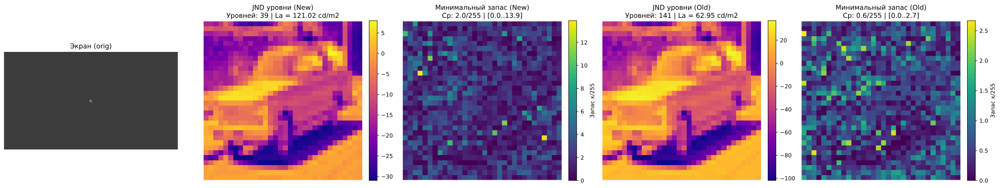

[cifar10_1 | 1.0cm] New: La=120.88 cd/m2, Levels=39, Запас=2.04/255 [0.00..14.03] | Old: La=63.16 cd/m2, Levels=141, Запас=0.62/255 [0.00..2.65]


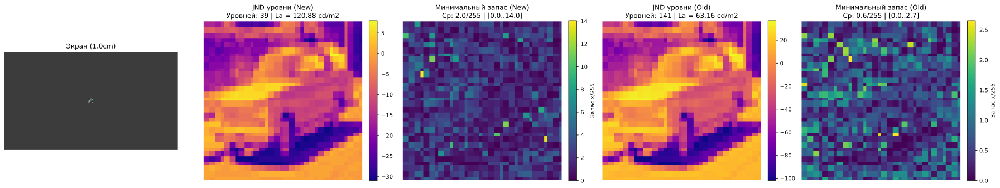

[cifar10_1 | 5.0cm] New: La=116.00 cd/m2, Levels=39, Запас=2.17/255 [0.00..9.32] | Old: La=62.70 cd/m2, Levels=141, Запас=0.61/255 [0.00..2.70]


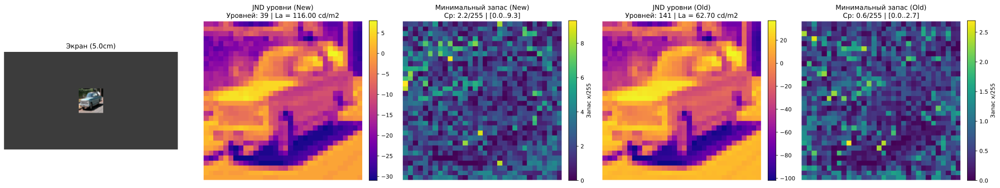

[cifar10_1 | 10.0cm] New: La=104.08 cd/m2, Levels=40, Запас=2.09/255 [0.00..15.08] | Old: La=62.79 cd/m2, Levels=141, Запас=0.61/255 [0.00..2.68]


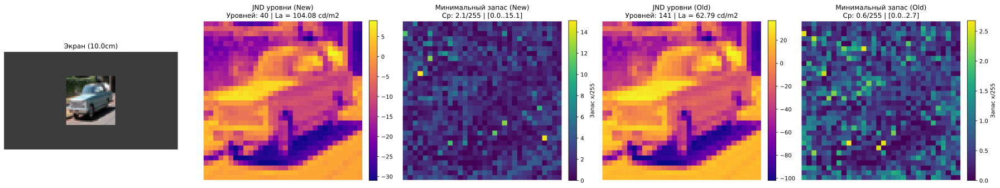

[cifar10_1 | 15.0cm] New: La=90.49 cd/m2, Levels=41, Запас=2.09/255 [0.00..15.39] | Old: La=62.99 cd/m2, Levels=141, Запас=0.62/255 [0.00..2.59]


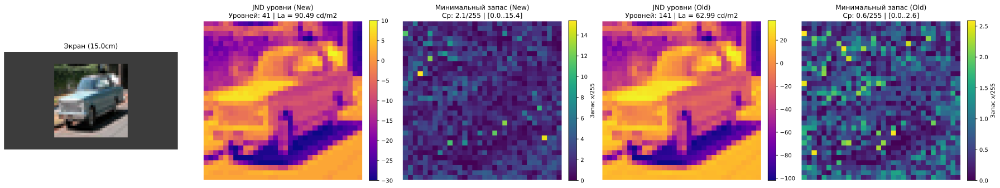


Тестирование cifar10_2.png:
[cifar10_2 | orig] New: La=121.07 cd/m2, Levels=39, Запас=1.75/255 [0.00..12.56] | Old: La=93.56 cd/m2, Levels=135, Запас=0.52/255 [0.00..2.58]


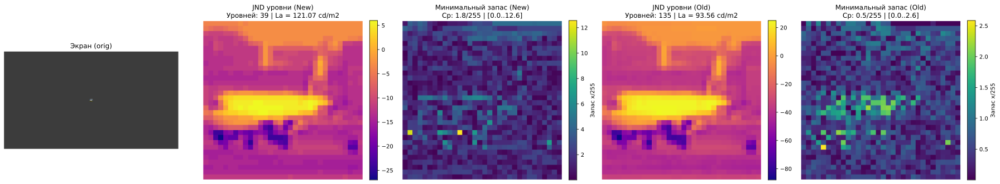

[cifar10_2 | 1.0cm] New: La=121.02 cd/m2, Levels=39, Запас=1.74/255 [0.00..12.61] | Old: La=94.39 cd/m2, Levels=135, Запас=0.52/255 [0.00..3.99]


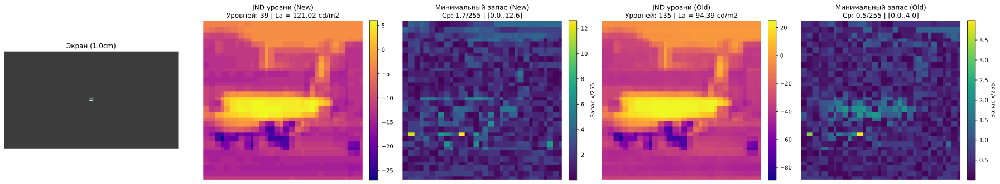

[cifar10_2 | 5.0cm] New: La=119.38 cd/m2, Levels=39, Запас=1.72/255 [0.00..14.40] | Old: La=93.58 cd/m2, Levels=135, Запас=0.52/255 [0.00..2.56]


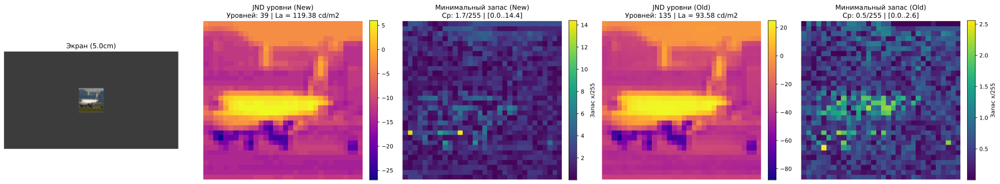

[cifar10_2 | 10.0cm] New: La=114.79 cd/m2, Levels=39, Запас=1.76/255 [0.00..8.99] | Old: La=93.48 cd/m2, Levels=135, Запас=0.52/255 [0.00..2.61]


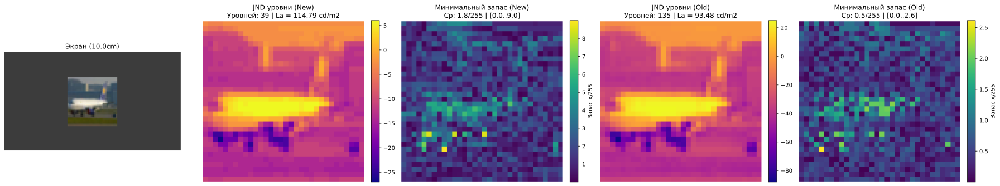

[cifar10_2 | 15.0cm] New: La=108.61 cd/m2, Levels=40, Запас=1.81/255 [0.01..8.06] | Old: La=93.60 cd/m2, Levels=135, Запас=0.52/255 [0.00..2.53]


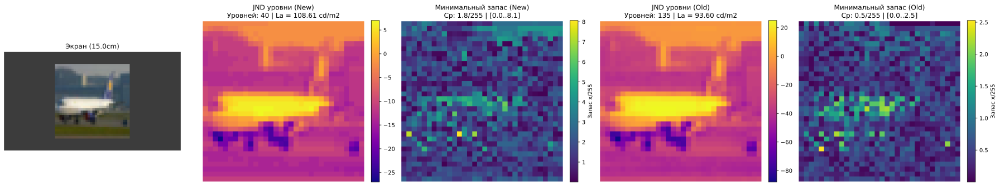


Тестирование imagenet_1.jpg:
[imagenet_1 | orig] New: La=121.13 cd/m2, Levels=39, Запас=2.15/255 [0.00..13.59] | Old: La=128.14 cd/m2, Levels=128, Запас=0.63/255 [0.00..3.22]


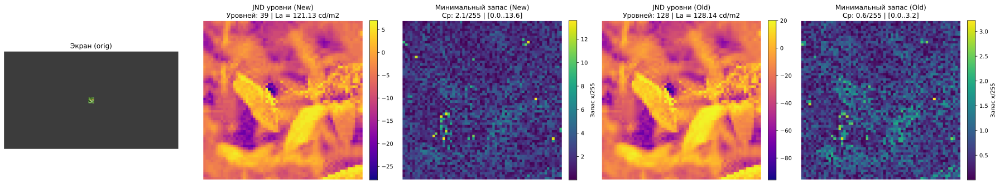

[imagenet_1 | 1.0cm] New: La=121.13 cd/m2, Levels=39, Запас=2.09/255 [0.00..13.38] | Old: La=130.93 cd/m2, Levels=128, Запас=0.64/255 [0.00..2.53]


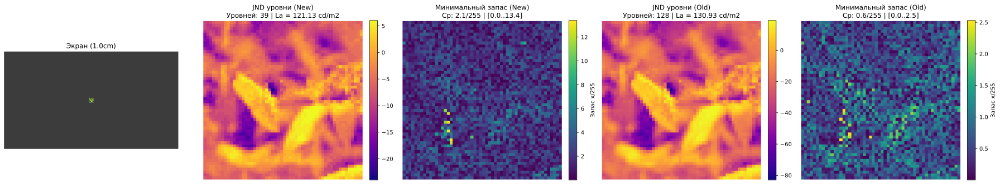

[imagenet_1 | 5.0cm] New: La=121.87 cd/m2, Levels=39, Запас=2.14/255 [0.00..12.78] | Old: La=128.14 cd/m2, Levels=128, Запас=0.63/255 [0.00..3.22]


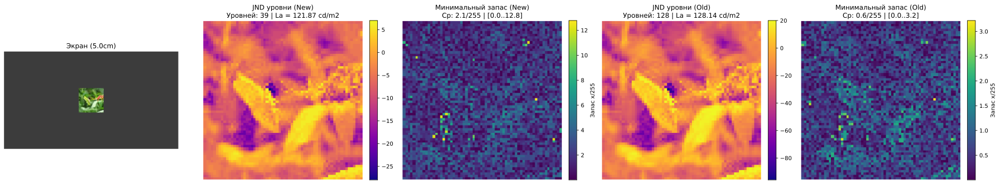

[imagenet_1 | 10.0cm] New: La=124.06 cd/m2, Levels=39, Запас=2.13/255 [0.00..10.40] | Old: La=127.99 cd/m2, Levels=128, Запас=0.63/255 [0.00..3.38]


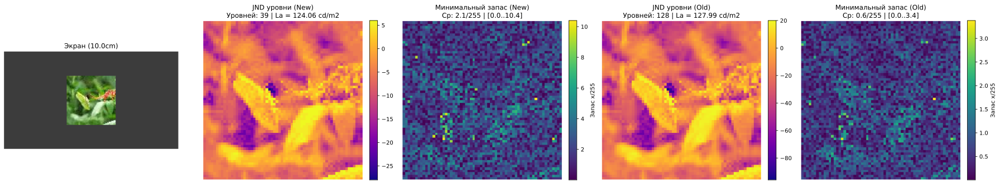

[imagenet_1 | 15.0cm] New: La=127.27 cd/m2, Levels=38, Запас=2.09/255 [0.00..9.02] | Old: La=128.00 cd/m2, Levels=128, Запас=0.63/255 [0.00..3.38]


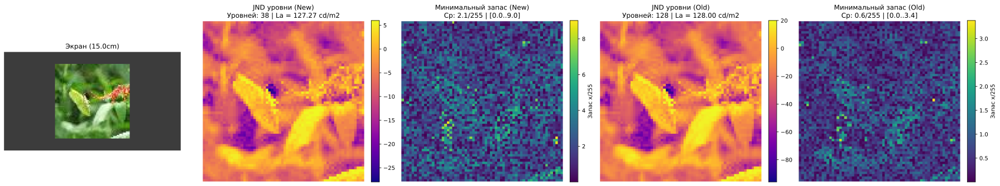


Тестирование imagenet_2.jpg:
[imagenet_2 | orig] New: La=120.65 cd/m2, Levels=39, Запас=1.97/255 [0.00..14.37] | Old: La=58.44 cd/m2, Levels=142, Запас=0.54/255 [0.00..2.58]


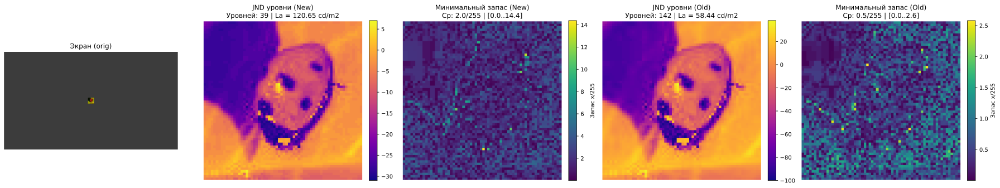

[imagenet_2 | 1.0cm] New: La=120.80 cd/m2, Levels=39, Запас=1.95/255 [0.00..14.25] | Old: La=61.33 cd/m2, Levels=142, Запас=0.55/255 [0.00..5.24]


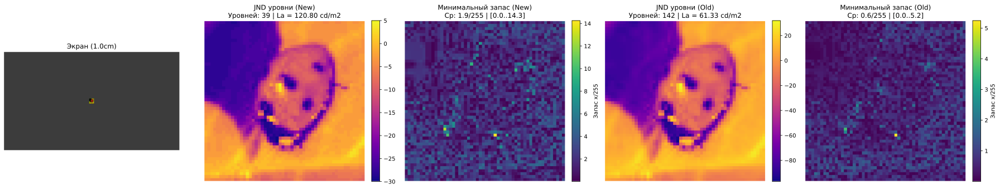

[imagenet_2 | 5.0cm] New: La=113.75 cd/m2, Levels=39, Запас=1.91/255 [0.00..9.44] | Old: La=58.17 cd/m2, Levels=142, Запас=0.53/255 [0.00..2.79]


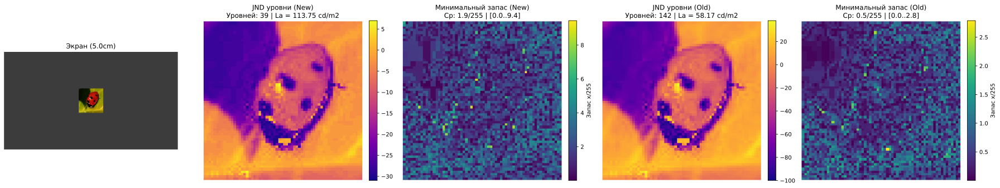

[imagenet_2 | 10.0cm] New: La=98.69 cd/m2, Levels=40, Запас=1.85/255 [0.00..8.98] | Old: La=58.32 cd/m2, Levels=142, Запас=0.54/255 [0.00..2.69]


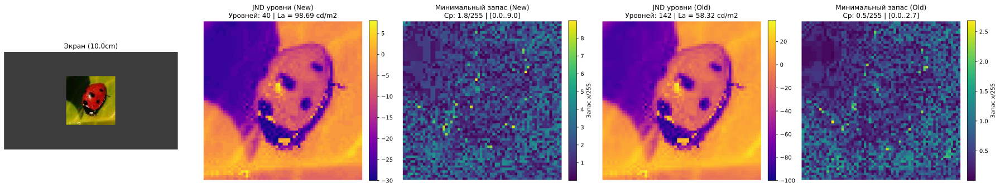

[imagenet_2 | 15.0cm] New: La=84.98 cd/m2, Levels=41, Запас=1.77/255 [0.00..9.09] | Old: La=58.37 cd/m2, Levels=142, Запас=0.54/255 [0.00..2.58]


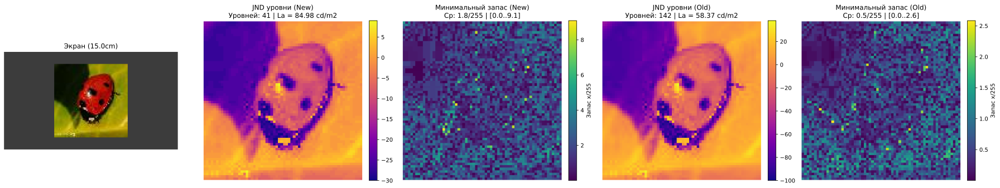


Тестирование tiny-imagenet_1.jpg:
[tiny-imagenet_1 | orig] New: La=126.21 cd/m2, Levels=38, Запас=2.18/255 [0.00..8.59] | Old: La=146.47 cd/m2, Levels=125, Запас=0.65/255 [0.00..2.79]


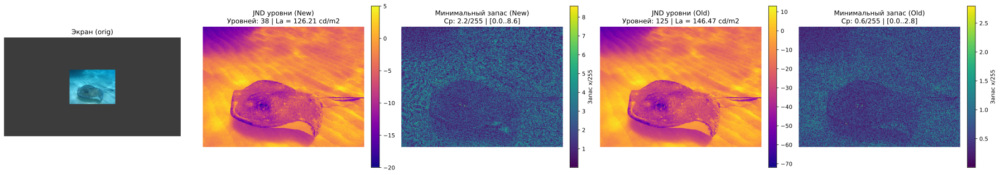

[tiny-imagenet_1 | 1.0cm] New: La=121.15 cd/m2, Levels=39, Запас=2.18/255 [0.00..6.01] | Old: La=146.58 cd/m2, Levels=125, Запас=0.64/255 [0.00..1.72]


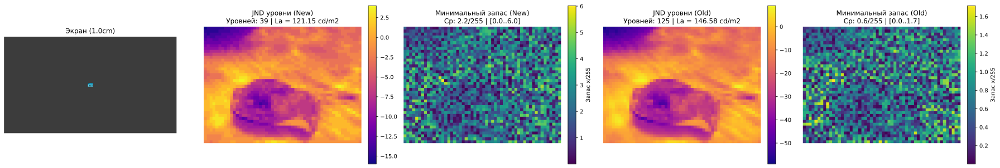

[tiny-imagenet_1 | 5.0cm] New: La=122.71 cd/m2, Levels=39, Запас=2.17/255 [0.00..11.88] | Old: La=146.54 cd/m2, Levels=125, Запас=0.65/255 [0.00..2.82]


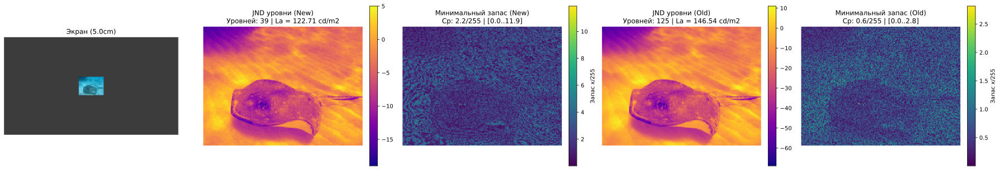

[tiny-imagenet_1 | 10.0cm] New: La=127.01 cd/m2, Levels=38, Запас=2.18/255 [0.00..9.24] | Old: La=146.35 cd/m2, Levels=125, Запас=0.65/255 [0.00..2.90]


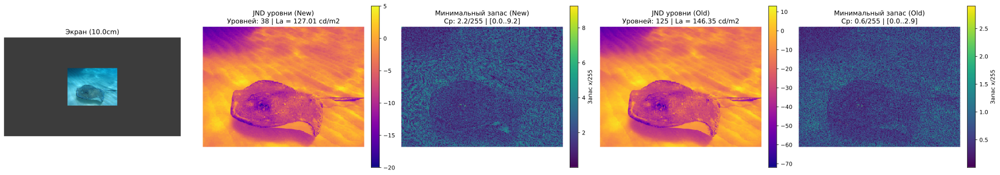

[tiny-imagenet_1 | 15.0cm] New: La=132.95 cd/m2, Levels=38, Запас=2.20/255 [0.00..9.77] | Old: La=146.39 cd/m2, Levels=125, Запас=0.65/255 [0.00..2.86]


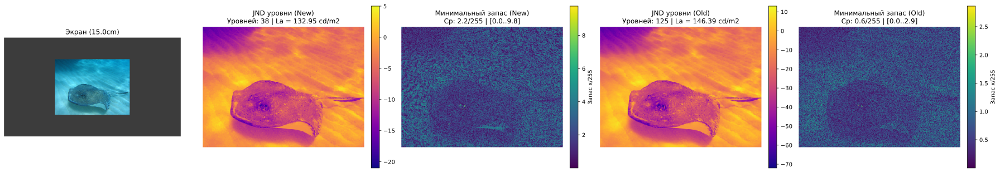


Тестирование tiny-imagenet_2.jpg:
[tiny-imagenet_2 | orig] New: La=111.95 cd/m2, Levels=39, Запас=2.02/255 [0.00..9.34] | Old: La=81.26 cd/m2, Levels=137, Запас=0.60/255 [0.00..3.92]


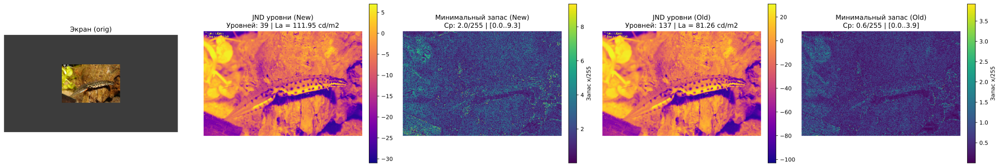

[tiny-imagenet_2 | 1.0cm] New: La=121.04 cd/m2, Levels=39, Запас=2.05/255 [0.01..13.77] | Old: La=89.94 cd/m2, Levels=135, Запас=0.60/255 [0.00..2.83]


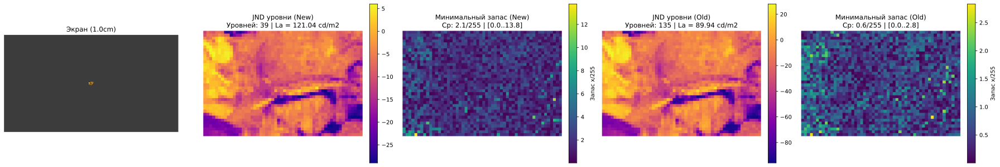

[tiny-imagenet_2 | 5.0cm] New: La=119.41 cd/m2, Levels=39, Запас=2.06/255 [0.00..15.79] | Old: La=83.54 cd/m2, Levels=137, Запас=0.60/255 [0.00..5.63]


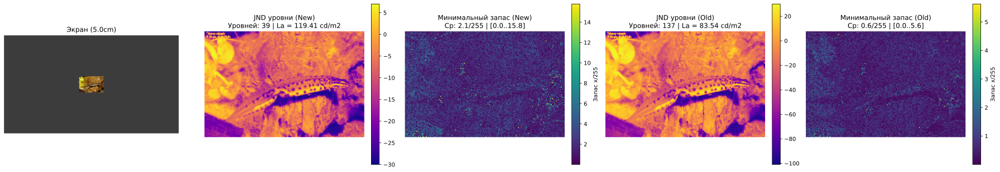

[tiny-imagenet_2 | 10.0cm] New: La=114.59 cd/m2, Levels=39, Запас=2.03/255 [0.00..9.57] | Old: La=82.51 cd/m2, Levels=137, Запас=0.59/255 [0.00..2.83]


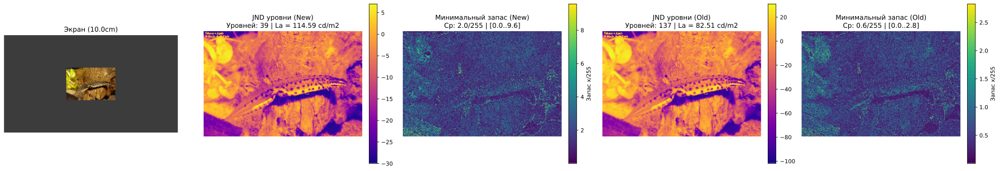

[tiny-imagenet_2 | 15.0cm] New: La=107.60 cd/m2, Levels=40, Запас=2.02/255 [0.00..10.78] | Old: La=81.26 cd/m2, Levels=137, Запас=0.60/255 [0.00..3.92]


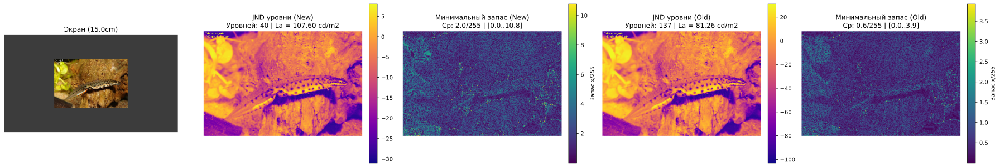

In [24]:
L_MIN = 0.1
L_MAX = 300.0
converter = ImageConverter()

JNDModel_without_custom_phi_d = JNDModel()
JNDModel_with_custom_phi_d = JNDModel.from_screen_params()

def compute_jnd_step_to_boundary_255(L_physical, jnd_model): 
    idx = np.searchsorted(jnd_model.bounds, L_physical, side='right') - 1 
    idx = np.clip(idx, 0, len(jnd_model.bounds) - 2)
    L_lower_bound = jnd_model.bounds[idx]
    L_upper_bound = jnd_model.bounds[idx + 1]

    L_norm_curr = (L_physical - jnd_model.L_MIN) / (jnd_model.L_MAX - jnd_model.L_MIN)
    L_norm_up = (L_upper_bound - jnd_model.L_MIN) / (jnd_model.L_MAX - jnd_model.L_MIN)
    L_norm_down = (L_lower_bound - jnd_model.L_MIN) / (jnd_model.L_MAX - jnd_model.L_MIN)

    def linear_to_srgb_255(lin):
        mask = lin <= 0.04045
        s = np.empty_like(lin)
        s[mask] = 12.92 * lin[mask]
        s[~mask] = 1.055 * (np.maximum(lin[~mask], 1e-12) ** (1.0 / 2.4)) - 0.055
        return np.clip(s, 0.0, 1.0) * 255.0

    I_curr = linear_to_srgb_255(L_norm_curr)
    I_up = linear_to_srgb_255(L_norm_up)
    I_down = linear_to_srgb_255(L_norm_down)

    delta_up = np.abs(I_up - I_curr)
    delta_down = np.abs(I_curr - I_down)
    delta_min_abs = np.minimum(delta_up, delta_down)

    return delta_min_abs, delta_up, delta_down

def prepare_stimulus_and_preview(
    img_path, 
    jnd_model_screen, 
    target_width_cm=None, 
    screen_w=1920, 
    screen_h=1080, 
    bg_gray_rgb=60,
    output_dir="results"
):
    img_path = Path(img_path)
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    xyL_image = converter.RGB_to_xyL(str(img_path))
    L_norm = xyL_image[..., 2]
    L_physical = L_MIN + (L_MAX - L_MIN) * L_norm

    img_rgb = np.array(Image.open(img_path).convert('RGB'))
    orig_h, orig_w = L_physical.shape

    ppi = getattr(jnd_model_screen, 'ppi', np.hypot(screen_w, screen_h) / 16.0)

    if target_width_cm is not None:
        target_w_px = int(np.round((target_width_cm / 2.54) * ppi))
        aspect_ratio = orig_h / orig_w
        target_h_px = int(np.round(target_w_px * aspect_ratio))

        interp = cv2.INTER_AREA if target_w_px < orig_w else cv2.INTER_NEAREST
        L_physical_stimulus = cv2.resize(L_physical, (target_w_px, target_h_px), interpolation=interp)
        img_stimulus = cv2.resize(img_rgb, (target_w_px, target_h_px), interpolation=interp)
    else:
        L_physical_stimulus = L_physical
        img_stimulus = img_rgb
        target_h_px, target_w_px = orig_h, orig_w

    L_physical_stimulus = np.clip(L_physical_stimulus, L_MIN, L_MAX)

    canvas = np.full((screen_h, screen_w, 3), fill_value=bg_gray_rgb, dtype=np.uint8)
    start_y = max(0, (screen_h - target_h_px) // 2)
    start_x = max(0, (screen_w - target_w_px) // 2)
    crop_y = max(0, (target_h_px - screen_h) // 2)
    crop_x = max(0, (target_w_px - screen_w) // 2)
    draw_h = min(screen_h, target_h_px)
    draw_w = min(screen_w, target_w_px)

    canvas[start_y:start_y + draw_h, start_x:start_x + draw_w] = (
        img_stimulus[crop_y:crop_y + draw_h, crop_x:crop_x + draw_w]
    )

    suffix = "orig" if target_width_cm is None else f"{target_width_cm}cm"
    save_path = output_dir / f"{img_path.stem}_screen_{suffix}.png"
    Image.fromarray(canvas).save(save_path)

    return L_physical_stimulus, canvas, suffix


def pipeline_comparison(img_path, model_old, model_new, output_dir="results"): 
    output_path = Path(output_dir) 
    output_path.mkdir(parents=True, exist_ok=True) 
    img_name = Path(img_path).stem

    for target_width_cm in [None, 1.0, 5.0, 10.0, 15.0]:
        L_physical_stimulus, screen_preview, suffix = prepare_stimulus_and_preview(
            img_path=img_path,
            jnd_model_screen=model_new,
            target_width_cm=target_width_cm,
            output_dir=output_dir
        )

        model_new.find_La_with_background(L_physical_stimulus)
        bounds_new = model_new.build_level_boundaries()
        k_map_new = model_new.L_to_k(L_physical_stimulus)
        levels_new = len(bounds_new) - 1
        budget_new, _, _ = compute_jnd_step_to_boundary_255(L_physical_stimulus, model_new)

        model_old.find_La(L_physical_stimulus)
        bounds_old = model_old.build_level_boundaries()
        k_map_old = model_old.L_to_k(L_physical_stimulus)
        levels_old = len(bounds_old) - 1
        budget_old, _, _ = compute_jnd_step_to_boundary_255(L_physical_stimulus, model_old)

        print(f"[{img_name} | {suffix}] New: La={model_new.La:.2f} cd/m2, Levels={levels_new}, Запас={budget_new.mean():.2f}/255 [{budget_new.min():.2f}..{budget_new.max():.2f}] | Old: La={model_old.La:.2f} cd/m2, Levels={levels_old}, Запас={budget_old.mean():.2f}/255 [{budget_old.min():.2f}..{budget_old.max():.2f}]")

        fig, axes = plt.subplots(1, 5, figsize=(25, 5))

        axes[0].imshow(screen_preview, interpolation='nearest')
        axes[0].set_title(f"Экран ({suffix})")
        axes[0].axis('off')

        im1 = axes[1].imshow(k_map_new, cmap='plasma', vmin=k_map_new.min(), vmax=k_map_new.max(), interpolation='nearest')
        axes[1].set_title(f"JND уровни (New)\nУровней: {levels_new} | La = {model_new.La:.2f} cd/m2")
        axes[1].axis('off')
        fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

        im2 = axes[2].imshow(budget_new, cmap='viridis', vmin=budget_new.min(), vmax=budget_new.max(), interpolation='nearest')
        axes[2].set_title(f"Минимальный запас (New)\nСр: {budget_new.mean():.1f}/255 | [{budget_new.min():.1f}..{budget_new.max():.1f}]")
        axes[2].axis('off')
        cb2 = fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)
        cb2.set_label('Запас x/255')

        im3 = axes[3].imshow(k_map_old, cmap='plasma', vmin=k_map_old.min(), vmax=k_map_old.max(), interpolation='nearest')
        axes[3].set_title(f"JND уровни (Old)\nУровней: {levels_old} | La = {model_old.La:.2f} cd/m2")
        axes[3].axis('off')
        fig.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

        im4 = axes[4].imshow(budget_old, cmap='viridis', vmin=budget_old.min(), vmax=budget_old.max(), interpolation='nearest')
        axes[4].set_title(f"Минимальный запас (Old)\nСр: {budget_old.mean():.1f}/255 | [{budget_old.min():.1f}..{budget_old.max():.1f}]")
        axes[4].axis('off')
        cb4 = fig.colorbar(im4, ax=axes[4], fraction=0.046, pad=0.04)
        cb4.set_label('Запас x/255')

        plt.tight_layout()
        plt.show()


img_dir = Path('examples')
images = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for img_name in images:
    img_path = img_dir / img_name
    print(f"\nТестирование {img_name}:")
    pipeline_comparison(
        img_path=img_path,
        model_old=JNDModel_without_custom_phi_d,
        model_new=JNDModel_with_custom_phi_d,
        output_dir="results"
    )